# 🎓 Deep Learning para Detecção de Áudio Sintético (Deepfake)

**Disciplina:** Defesa Cibernética  
**Tema:** Deep Learning aplicadas à detecção de áudio real vs. sintético  
**Dataset:** [BRSpeech-DF — AKCIT-Deepfake](https://huggingface.co/datasets/AKCIT-Deepfake/BRSpeech-DF)

## 🎯 Objetivos de aprendizagem

Ao final desta aula prática, você será capaz de:

1. Relacionar CNNs com um problema de cibersegurança: identificação de fala sintética/deepfake.
2. Entender por que um áudio pode ser transformado em uma representação 2D.
3. Construir um espectrograma Log-Mel.
4. Treinar uma CNN 2D para classificar `bonafide` e `spoof`.
5. Comparar uma MLP com uma CNN.
6. Avaliar o detector com Accuracy, Precision, Recall, F1, ROC-AUC, matriz de confusão e EER.
7. Visualizar feature maps e discutir limitações de generalização.

> **Ideia central:** o áudio é um sinal 1D no tempo. Vamos transformá-lo em uma representação tempo × frequência e aplicar os mesmos princípios de convolução, pooling e extração hierárquica vistos na aula de CNNs para imagens.


## 1. 🔐 Contexto

Áudios sintéticos podem ser utilizados em fraude, engenharia social, impersonação e golpes de voz.

O **BRSpeech-DF** é um dataset de detecção de deepfake de fala em português, com as classes `bonafide` (fala humana real) e `spoof` (fala sintética). A página do dataset informa aproximadamente 459 mil amostras e padronização dos áudios para 24 kHz.

A base original é fortemente desbalanceada:

| Split | Bonafide | Spoof | Total |
|---|---:|---:|---:|
| Treino | 74.163 | 370.111 | 444.274 |
| Validação | 1.161 | 5.795 | 6.956 |
| Teste | 1.320 | 6.587 | 7.907 |

### Quantitativos usados na aula

| Split | bonafide | spoof | total |
|---|---:|---:|---:|
| **Treino** | 500 | 500 | 1.000 |
| **Validação** | 100 | 100 | 200 |
| **Teste** | 100 | 100 | 200 |


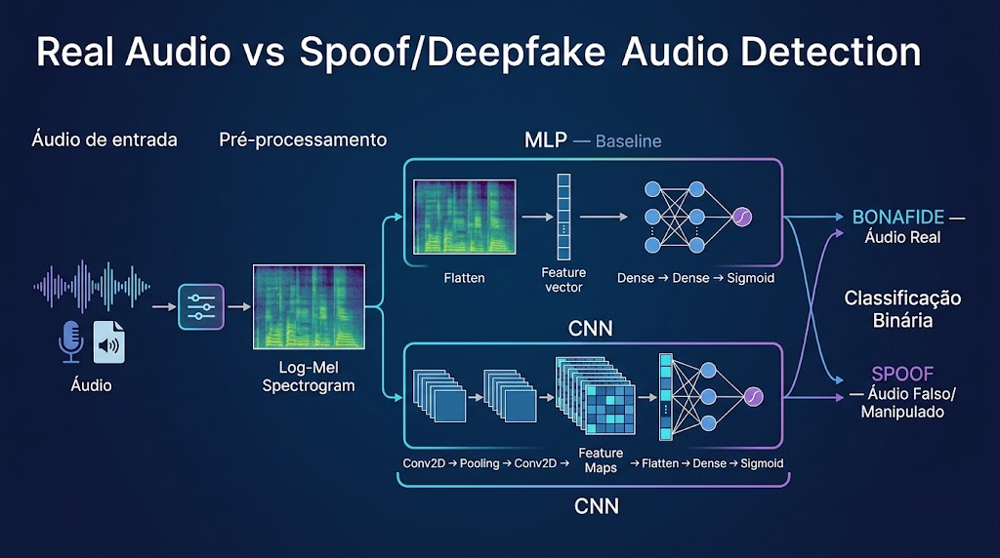

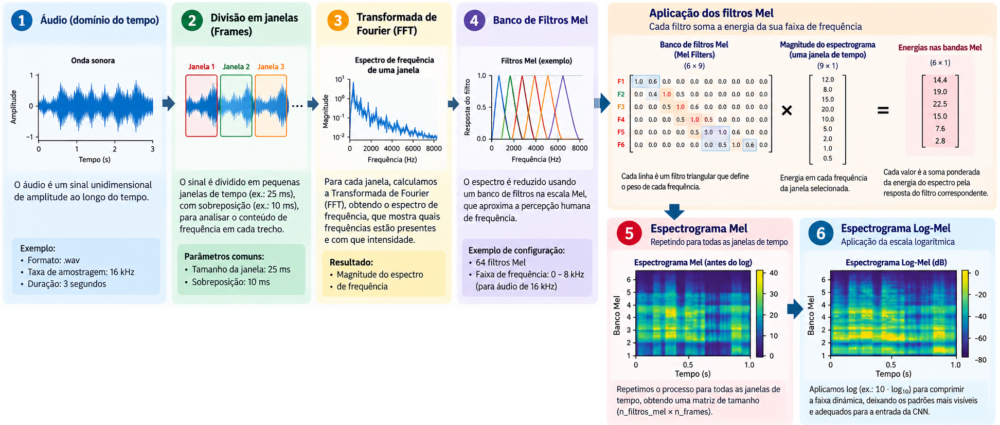

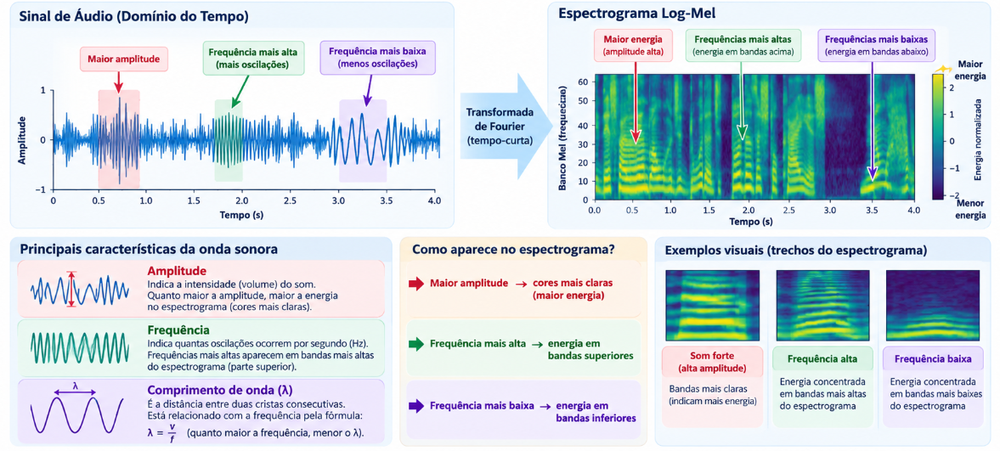

# 1. CONFIGURAÇÃO DO AMBIENTE

In [ ]:
!pip -q install -U "datasets[audio]" soundfile

In [ ]:
import os
import gc
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import soundfile as sf
import tensorflow as tf

from datasets import load_dataset, Audio
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    roc_curve,
)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

DATASET_ID = "AKCIT-Deepfake/BRSpeech-DF"

# Trabalhamos em 16 kHz internamente para reduzir custo.
# O dataset original foi padronizado em 24 kHz.
SAMPLE_RATE = 16_000

# Janela fixa que será usada pelo modelo
TARGET_SECONDS = 4
TARGET_SAMPLES = SAMPLE_RATE * TARGET_SECONDS

# STFT / Log-Mel
FRAME_LENGTH = 512
FRAME_STEP = 256
FFT_LENGTH = 512
N_MELS = 64
FMIN = 20.0
FMAX = SAMPLE_RATE / 2

BATCH_SIZE = 32
EPOCHS = 60

COUNTS = {
    "train": {"bonafide": 700, "spoof": 700},
    "validation": {"bonafide": 50, "spoof": 50},
    "test": {"bonafide": 50, "spoof": 50},
}

WORK_DIR = Path("/content/brspeech_df_aula")
AUDIO_DIR = WORK_DIR / "audio"
SPEC_DIR = WORK_DIR / "spectrograms"

for d in [WORK_DIR, AUDIO_DIR, SPEC_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices("GPU"))
print("Diretório:", WORK_DIR)


## 2. Conhecendo o formato do dataset

O BRSpeech-DF é compatível com o carregamento de datasets de áudio do Hugging Face.

A estrutura conceitual é:

```text
train/
    bonafide/
    spoof/
validation/
    bonafide/
    spoof/
test/
    bonafide/
    spoof/
```

Os rótulos são:

- `0` → `bonafide`
- `1` → `spoof`


In [ ]:
preview = load_dataset(DATASET_ID, split="train", streaming=True)
example = next(iter(preview))

print("Chaves:", example.keys())
print("Label:", example["label"])
print("Tipo do label:", type(example["label"]))

if isinstance(example["audio"], dict):
    print("Chaves do áudio:", example["audio"].keys())


## 3. Amostragem balanceada

Vamos coletar **exatamente** a quantidade desejada de cada classe em cada split.

A função abaixo trabalha em streaming e salva cada áudio assim que ele é selecionado.

Isso evita manter centenas de ondas de áudio simultaneamente na memória.

Também usamos um **shuffle buffer pequeno**. Ele não garante uma aleatoriedade global perfeita, mas é suficiente para uma amostra didática...


In [ ]:
LABEL_NAMES = {0: "bonafide", 1: "spoof"}

def sample_and_cache_split(split, target_counts, seed=42, shuffle_buffer=256):
    split_dir = AUDIO_DIR / split
    split_dir.mkdir(parents=True, exist_ok=True)
    manifest_path = split_dir / "manifest.csv"

    expected = sum(target_counts.values())

    if manifest_path.exists():
        old = pd.read_csv(manifest_path)
        if len(old) == expected and set(old["label_name"]) == set(target_counts):
            print(f"[{split}] Cache encontrado: {len(old)} arquivos.")
            return old

    ds = load_dataset(DATASET_ID, split=split, streaming=True)

    # Mantemos o buffer pequeno para limitar o uso de memória.
    ds = ds.shuffle(seed=seed, buffer_size=shuffle_buffer)

    # Decodificação em 16 kHz.
    ds = ds.cast_column("audio", Audio(sampling_rate=SAMPLE_RATE))

    remaining = dict(target_counts)
    counters = {"bonafide": 0, "spoof": 0}
    rows = []

    for example in ds:
        label_id = int(example["label"])
        label_name = LABEL_NAMES[label_id]

        if remaining[label_name] <= 0:
            if all(v == 0 for v in remaining.values()):
                break
            continue

        audio = example["audio"]
        array = np.asarray(audio["array"], dtype=np.float32)

        if array.ndim > 1:
            array = np.mean(array, axis=-1)

        idx = counters[label_name]
        filename = f"{split}_{label_name}_{idx:04d}.wav"
        output_path = split_dir / filename

        sf.write(output_path, array, SAMPLE_RATE, subtype="PCM_16")

        rows.append({
            "split": split,
            "path": str(output_path),
            "label": label_id,
            "label_name": label_name,
            "duration_sec": len(array) / SAMPLE_RATE,
        })

        counters[label_name] += 1
        remaining[label_name] -= 1

        # Libera a referência do áudio antes do próximo item.
        del array
        del audio

        if all(v == 0 for v in remaining.values()):
            break

    del ds
    gc.collect()

    manifest = pd.DataFrame(rows)

    if len(manifest) != expected:
        raise RuntimeError(
            f"[{split}] Esperados {expected} exemplos, "
            f"mas foram coletados {len(manifest)}."
        )

    manifest.to_csv(manifest_path, index=False)
    return manifest


manifests = {}

for split in ["train", "validation", "test"]:
    print(f"\nColetando {split}...")
    manifests[split] = sample_and_cache_split(
        split,
        COUNTS[split],
        seed=SEED,
        shuffle_buffer=256,
    )
    print(manifests[split]["label_name"].value_counts().to_dict())

manifest = pd.concat(manifests.values(), ignore_index=True)

print("\nDistribuição final:")
print(pd.crosstab(manifest["split"], manifest["label_name"]))

print("\nTotal:", len(manifest))


 ## 4. DURAÇÃO DOS ÁUDIOS SELECIONADOS

In [ ]:
display(
    manifest.groupby(["split", "label_name"])["duration_sec"]
    .agg(["count", "mean", "median", "min", "max"])
    .round(2)
)

plt.figure(figsize=(10, 5))
sns.histplot(
    data=manifest,
    x="duration_sec",
    hue="label_name",
    bins=30,
    element="step",
    stat="density",
    common_norm=False,
)
plt.title("Distribuição das durações")
plt.xlabel("Duração (s)")
plt.ylabel("Densidade")
plt.show()


## 5. Do áudio para a “imagem”: STFT → Mel → Log-Mel

No áudio, uma das representações mais intuitivas é o **espectrograma**, que mostra como a energia se distribui por diferentes frequências ao longo do tempo.

### Fluxo de Processamento

```text
Waveform
   ↓
STFT
   ↓
Energia por frequência
   ↓
Banco de filtros Mel
   ↓
Log-Mel
   ↓
Matriz 2D
   ├──> 1. MLP (Baseline - vetor achatado)
   └──> 2. CNN 2D (Preserva a estrutura 2D)
```

Nessa matriz final, o eixo horizontal representa o tempo e o eixo vertical representa as bandas Mel.

In [ ]:

def fix_length(waveform, target_samples=TARGET_SAMPLES, training=False):
    """Ajusta o áudio para um tamanho fixo."""
    waveform = np.asarray(waveform, dtype=np.float32)

    if len(waveform) < target_samples:
        padded = np.zeros(target_samples, dtype=np.float32)
        padded[:len(waveform)] = waveform
        return padded

    if len(waveform) == target_samples:
        return waveform

    if training:
        start = np.random.randint(0, len(waveform) - target_samples + 1)
    else:
        start = (len(waveform) - target_samples) // 2

    return waveform[start:start + target_samples]


def waveform_to_logmel(waveform):
    """Converte waveform em espectrograma Log-Mel normalizado."""
    x = tf.convert_to_tensor(waveform, dtype=tf.float32)

    x = x / (tf.reduce_max(tf.abs(x)) + 1e-8)

    stft = tf.signal.stft(
        x,
        frame_length=FRAME_LENGTH,
        frame_step=FRAME_STEP,
        fft_length=FFT_LENGTH,
        window_fn=tf.signal.hann_window,
        pad_end=False,
    )

    power = tf.square(tf.abs(stft))

    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=N_MELS,
        num_spectrogram_bins=FFT_LENGTH // 2 + 1,
        sample_rate=SAMPLE_RATE,
        lower_edge_hertz=FMIN,
        upper_edge_hertz=FMAX,
    )

    mel = tf.matmul(power, mel_matrix)
    log_mel = tf.math.log(mel + 1e-6)

    log_mel = (
        log_mel - tf.reduce_mean(log_mel)
    ) / (tf.math.reduce_std(log_mel) + 1e-6)

    # [tempo, mel] -> [mel, tempo]
    return tf.transpose(log_mel).numpy().astype(np.float32)


def audio_file_to_logmel(path):
    waveform, sr = sf.read(path, dtype="float32")

    if waveform.ndim > 1:
        waveform = np.mean(waveform, axis=-1)

    if sr != SAMPLE_RATE:
        raise ValueError(f"Sample rate inesperado: {sr}")

    waveform = fix_length(waveform, TARGET_SAMPLES, training=False)
    return waveform_to_logmel(waveform)


dummy = np.zeros(TARGET_SAMPLES, dtype=np.float32)
dummy_spec = waveform_to_logmel(dummy)
N_FRAMES = dummy_spec.shape[1]

print("Áudio:", TARGET_SAMPLES, "amostras")
print("Log-Mel:", dummy_spec.shape)
print("Entrada CNN:", (N_MELS, N_FRAMES, 1))


In [ ]:
# ============================================================
# 6. VISUALIZAÇÃO DO ÁUDIO E DO LOG-MEL
# ============================================================

sample_row = manifest[
    (manifest["split"] == "train") &
    (manifest["label_name"] == "bonafide")
].iloc[0]

waveform, sr = sf.read(sample_row["path"], dtype="float32")

if waveform.ndim > 1:
    waveform = np.mean(waveform, axis=-1)

audio_4s = fix_length(waveform, TARGET_SAMPLES, training=False)
spec = waveform_to_logmel(audio_4s)

time_axis = np.arange(len(audio_4s)) / SAMPLE_RATE

plt.figure(figsize=(12, 3))
plt.plot(time_axis, audio_4s)
plt.title("Forma de onda — bonafide")
plt.xlabel("Tempo (s)")
plt.ylabel("Amplitude")
plt.show()

plt.figure(figsize=(12, 4))
plt.imshow(
    spec,
    origin="lower",
    aspect="auto",
    extent=[0, TARGET_SECONDS, 0, N_MELS],
)
plt.colorbar(label="Energia normalizada")
plt.title("Espectrograma Log-Mel")
plt.xlabel("Tempo (s)")
plt.ylabel("Banco Mel")
plt.show()


## 5. Cache de espectrogramas

Para não ficar decodificando áudio remoto em todas as épocas, vamos materializar somente os 1.400 exemplos selecionados.

Cada espectrograma será salvo como um pequeno arquivo `.npy`.

O treinamento posterior lê esses arquivos em batches:

```text
disco
  ↓
batch
  ↓
MLP/CNN
  ↓
atualização dos pesos
```

Assim, o conjunto completo não precisa ficar expandido na RAM.


In [ ]:
# ============================================================
# 7. CACHE DOS ESPECTROGRAMAS
# ============================================================

def build_spectrogram_cache(df):
    cache_paths = []

    for i, row in enumerate(df.itertuples(index=False), start=1):
        src = Path(row.path)
        cache_path = SPEC_DIR / f"{src.stem}.npy"

        if not cache_path.exists():
            spec = audio_file_to_logmel(src)
            np.save(cache_path, spec)
            del spec
            gc.collect()

        cache_paths.append(str(cache_path))

        if i % 100 == 0 or i == len(df):
            print(f"Processados: {i}/{len(df)}")

    result = df.copy()
    result["spec_path"] = cache_paths
    return result

manifest = build_spectrogram_cache(manifest)


display(manifest.head())


## 6. `tf.data`: carregamento por batch

Agora separamos os três splits.

Não usamos `train_test_split`, pois queremos preservar os splits oficiais do dataset.

O `tf.data.Dataset` ficará responsável por carregar os `.npy` apenas quando forem necessários.


In [ ]:
# ============================================================
# 8. TF.DATA
# ============================================================

train_df = manifest[manifest["split"] == "train"].reset_index(drop=True)
val_df = manifest[manifest["split"] == "validation"].reset_index(drop=True)
test_df = manifest[manifest["split"] == "test"].reset_index(drop=True)


N_EXTRA_VAL = 300
N_EXTRA_TEST = 300

extra_val = train_df.sample(
    n=N_EXTRA_VAL,
    random_state=SEED
)

extra_test = train_df.sample(
    n=N_EXTRA_TEST,
    random_state=SEED + 1
)

# Adiciona aos conjuntos
val_df = pd.concat(
    [val_df, extra_val],
    ignore_index=True
)

test_df = pd.concat(
    [test_df, extra_test],
    ignore_index=True
)

# Opcional: embaralhar
val_df = val_df.sample(
    frac=1,
    random_state=SEED
).reset_index(drop=True)

test_df = test_df.sample(
    frac=1,
    random_state=SEED
).reset_index(drop=True)

train_paths = train_df["spec_path"].values
train_labels = train_df["label"].astype(np.float32).values

val_paths = val_df["spec_path"].values
val_labels = val_df["label"].astype(np.float32).values

test_paths = test_df["spec_path"].values
test_labels = test_df["label"].astype(np.float32).values


def load_npy(path, label):
    def _load(path_bytes):
        return np.load(
            path_bytes.decode("utf-8")
        ).astype(np.float32)

    spec = tf.numpy_function(
        _load,
        [path],
        Tout=tf.float32,
    )

    spec.set_shape([N_MELS, N_FRAMES])
    spec = tf.expand_dims(spec, axis=-1)

    return spec, label


def make_dataset(paths, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    if training:
        ds = ds.shuffle(
            buffer_size=len(paths),
            seed=SEED,
            reshuffle_each_iteration=True,
        )

    ds = ds.map(
        load_npy,
        num_parallel_calls=tf.data.AUTOTUNE,
    )

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds


train_ds = make_dataset(train_paths, train_labels, training=True)
val_ds = make_dataset(val_paths, val_labels)
test_ds = make_dataset(test_paths, test_labels)

print("Train:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))


In [ ]:
from IPython.display import Audio, display

# Exemplo BONAFIDE
sample_bonafide = test_df[test_df["label"] == 0].iloc[0]

print("Exemplo BONAFIDE")
print("Arquivo:", sample_bonafide["path"])

display(Audio(sample_bonafide["path"]))


# Exemplo SPOOF
sample_spoof = test_df[test_df["label"] == 1].iloc[0]

print("Exemplo SPOOF")
print("Arquivo:", sample_spoof["path"])

display(Audio(sample_spoof["path"]))

# 7. Baseline: MLP (Multilayer Perceptron)

Antes de aplicar redes mais complexas, utilizaremos uma MLP como modelo de baseline:

Como funciona: A matriz 2D do espectrograma é "achatada" (flatten) em um único vetor unidimensional antes de entrar na rede.

Objetivo: Estabelecer uma métrica inicial de desempenho. Como a MLP não preserva a relação espacial entre frequências e tempo vizinhos, essa etapa serve para entender o limite de um modelo simples que ignora a estrutura bidimensional do áudio.


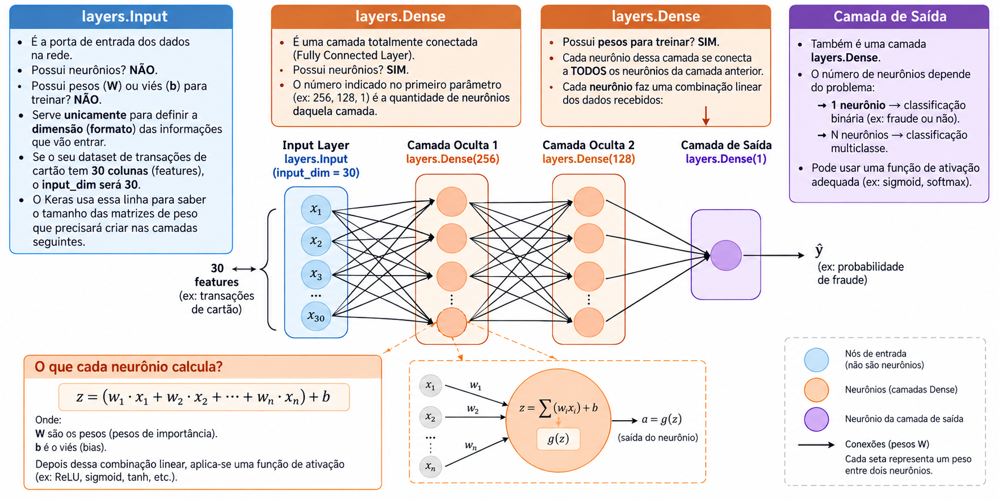

#### Função de Ativação

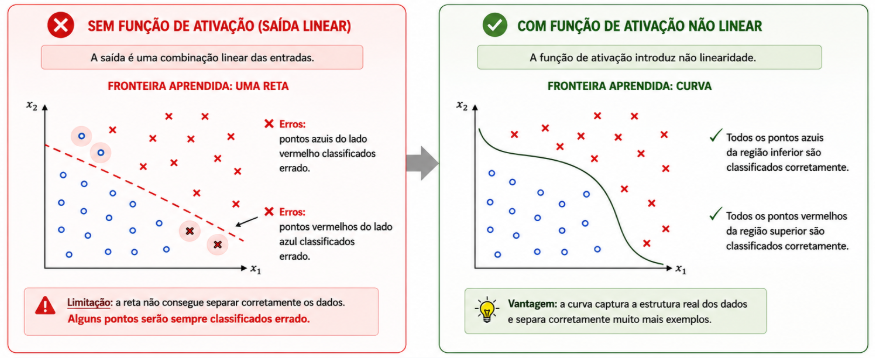

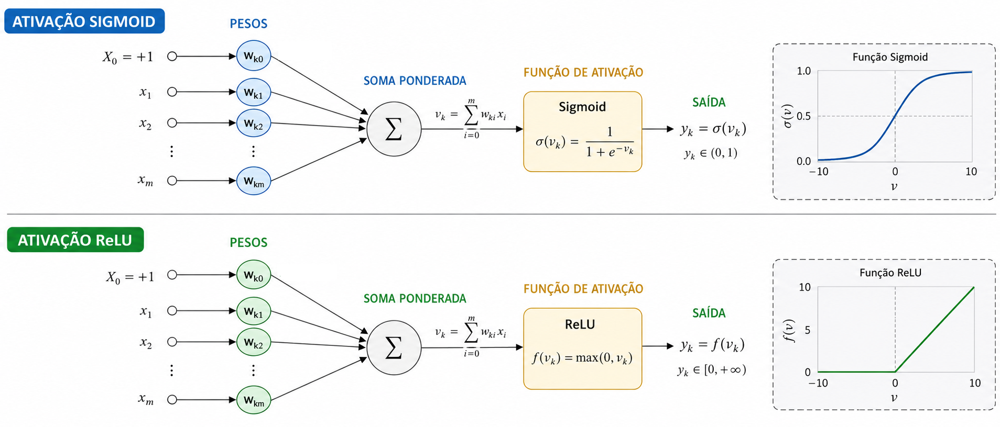

Se a camada Dense faz apenas contas lineares ($z = Wx + b$), o que acontece se empilharmos 10 camadas Dense sem função de ativação? A rede inteira se comporta matematicamente como uma única grande função linear! Ela seria incapaz de aprender padrões complexos, curvas e fronteiras de decisão não-lineares.A função de ativação é aplicada logo após o cálculo $z = Wx + b$ para introduzir a não-linearidade.

#### Treinamento

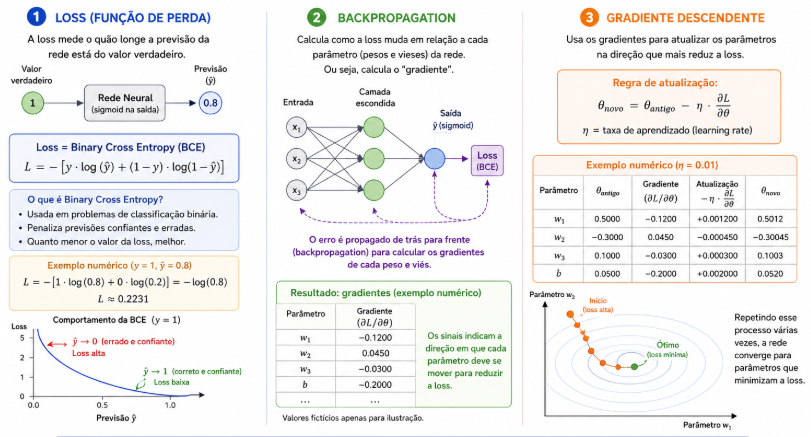

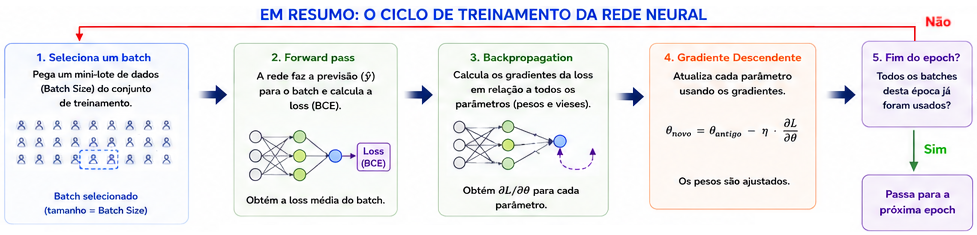

**Por que usamos ReLU nas camadas intermediárias (ocultas)?**
- Computacionalmente muito rápida: Requer apenas verificar se o valor é maior que zero, sem calcular exponenciais complexas.
- Combate o Desaparecimento do Gradiente (Vanishing Gradient): Em redes profundas com ativações antigas (como Sigmoid), o gradiente vai ficando próximo de zero à medida que retropropagamos o erro, fazendo a rede parar de aprender. A ReLU tem derivada constante ($=1$) para valores positivos, permitindo que o aprendizado flua bem pelas camadas profundas.
- Ativação Esparsa: Como zera qualquer entrada negativa, ela desativa parte dos neurônios a cada entrada, tornando a representação na rede mais eficiente.

**Por que usamos Sigmoid na camada final deste modelo?**

Nosso problema é de classificação binária (0: Legítima | 1: Fraude). Como a saída da Sigmoid está entre $0$ e $1$, podemos interpretá-la diretamente como uma PROBABILIDADE:
- Saída $= 0.03 \rightarrow 3\%$ de chance de ser fraude (prevê classe $0$).
- Saída $= 0.92 \rightarrow 92\%$ de chance de ser fraude (prevê classe $1$).

# Função de Ativação

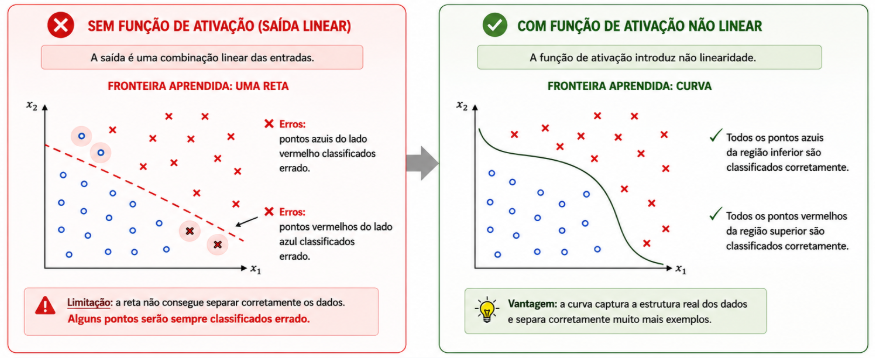

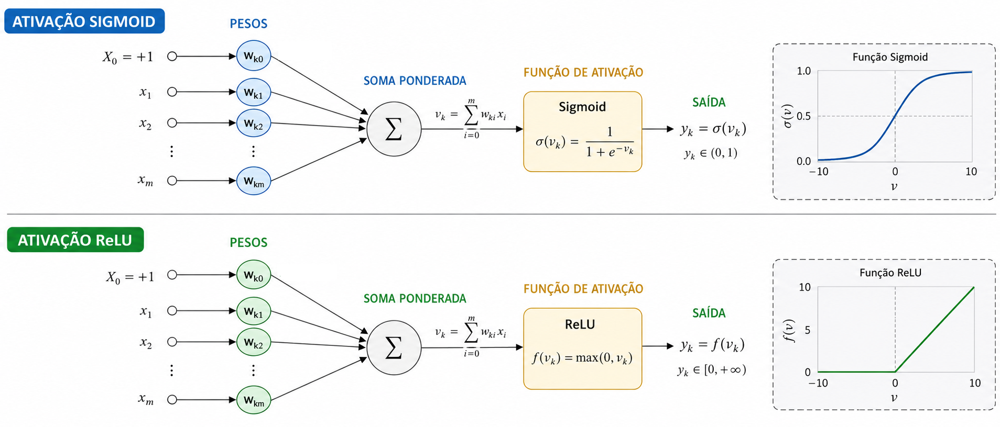

Se a camada Dense faz apenas contas lineares ($z = Wx + b$), o que acontece se empilharmos 10 camadas Dense sem função de ativação? A rede inteira se comporta matematicamente como uma única grande função linear! Ela seria incapaz de aprender padrões complexos, curvas e fronteiras de decisão não-lineares.A função de ativação é aplicada logo após o cálculo $z = Wx + b$ para introduzir a não-linearidade.

#### Treinamento

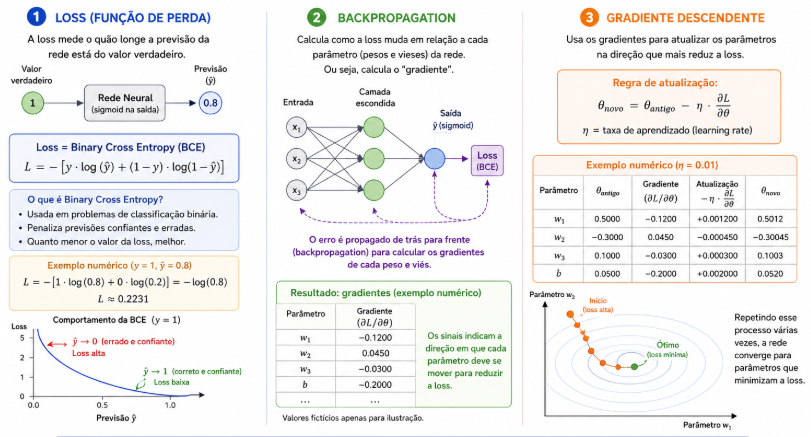

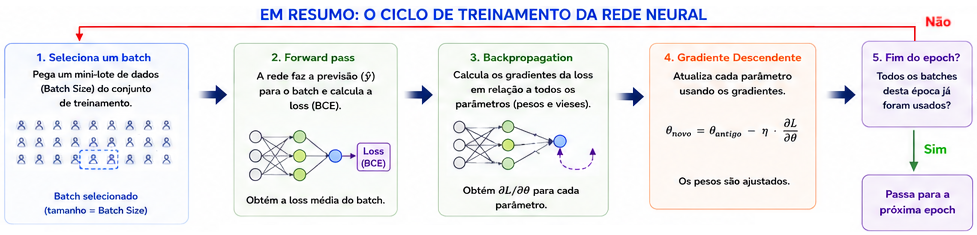

**Por que usamos ReLU nas camadas intermediárias (ocultas)?**
- Computacionalmente muito rápida: Requer apenas verificar se o valor é maior que zero, sem calcular exponenciais complexas.
- Combate o Desaparecimento do Gradiente (Vanishing Gradient): Em redes profundas com ativações antigas (como Sigmoid), o gradiente vai ficando próximo de zero à medida que retropropagamos o erro, fazendo a rede parar de aprender. A ReLU tem derivada constante ($=1$) para valores positivos, permitindo que o aprendizado flua bem pelas camadas profundas.
- Ativação Esparsa: Como zera qualquer entrada negativa, ela desativa parte dos neurônios a cada entrada, tornando a representação na rede mais eficiente.

**Por que usamos Sigmoid na camada final deste modelo?**

Nosso problema é de classificação binária (transação 0: Legítima | 1: Fraude). Como a saída da Sigmoid está entre $0$ e $1$, podemos interpretá-la diretamente como uma PROBABILIDADE:
- Saída $= 0.03 \rightarrow 3\%$ de chance de ser fraude (prevê classe $0$).
- Saída $= 0.92 \rightarrow 92\%$ de chance de ser fraude (prevê classe $1$).

### 🛠️ Técnicas para evitar overfitting Batch Normalization, Dropout e Callbacks

### Estratégia de Engenharia da Arquitetura de Redes Neurais:
1. **BatchNormalization**
2. **Dropout**
4. **Callbacks Nativos**

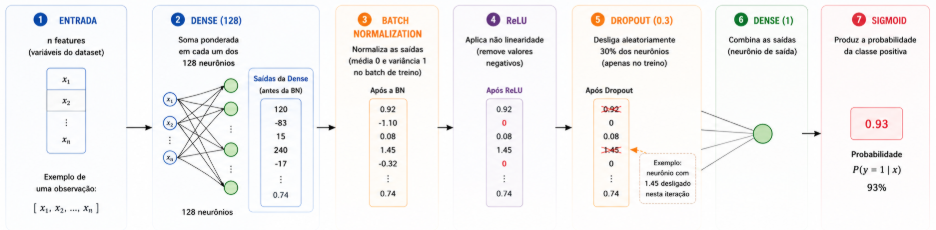

Losses

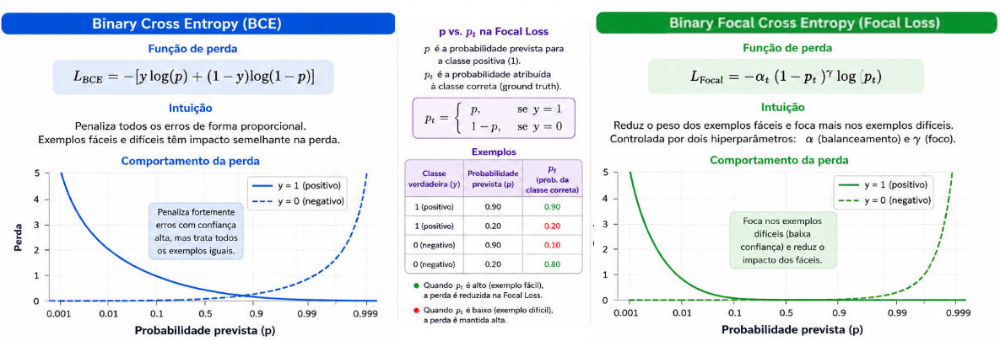

In [ ]:
# TODO calcule a dimensão da entrada do MLP multiplicando o número de bandas Mel
# pelo número de frames do espectrograma.
# Escreva: INPUT_DIM = N_MELS * N_FRAMES
INPUT_DIM = ...


# TODO crie um modelo MLP usando tf.keras.Sequential.
mlp = tf.keras.Sequential([

    # TODO adicione uma camada Input com shape=(N_MELS, N_FRAMES, 1).
    ...,

    # TODO aplique Flatten() para transformar o espectrograma 2D em um vetor 1D,
    # permitindo que os valores dos pixels do espectrograma sejam usados
    # como entrada das camadas Dense.
    ...,

    # TODO adicione uma camada Dense com 32 neurônios e ativação ReLU.
    ...,

    # TODO adicione Dropout com taxa de 0.30 para reduzir overfitting
    # desligando aleatoriamente 30% dos neurônios durante o treinamento.
    ...,

    # TODO adicione uma camada Dense com 16 neurônios e ativação ReLU.
    ...,

    # TODO adicione Dropout com taxa de 0.20.
    ...,

    # TODO adicione uma camada Dense de saída com 1 neurônio e ativação sigmoid
    # para produzir uma probabilidade entre 0 e 1 para a classificação binária.
    ...,

], name="MLP_baseline")


# TODO compile o modelo usando o otimizador Adam com learning rate=1e-7.
# Escreva: optimizer=tf.keras.optimizers.Adam(1e-7)
# TODO use loss="binary_crossentropy" porque o problema possui duas classes.
# TODO adicione as métricas BinaryAccuracy, Precision, Recall e AUC,
# mantendo os nomes "accuracy", "precision", "recall" e "auc".
mlp.compile()


mlp.summary()

# 8. CNN sobre o espectrograma Log-Mel

Após estabelecer nossa referência com a MLP, avançamos para a CNN 2D:

Por que usá-la? Redes convolucionais funcionam naturalmente sobre estruturas bidimensionais, permitindo preservar a geometria do espectrograma.

Como funciona: A CNN aplica filtros que procuram padrões locais na matriz (como subidas de tom ao longo do tempo ou harmonias), exatamente como identifica bordas, curvas e texturas em uma imagem tradicional.

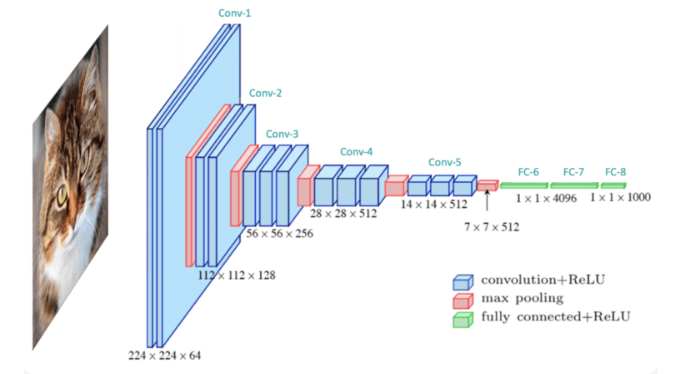

#### Convolução

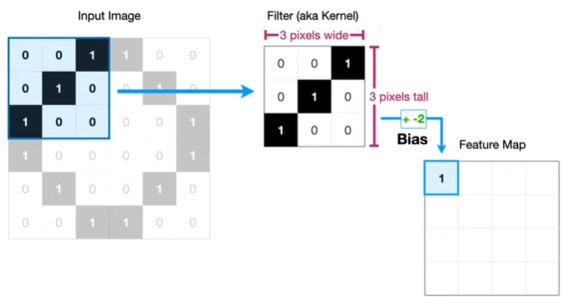

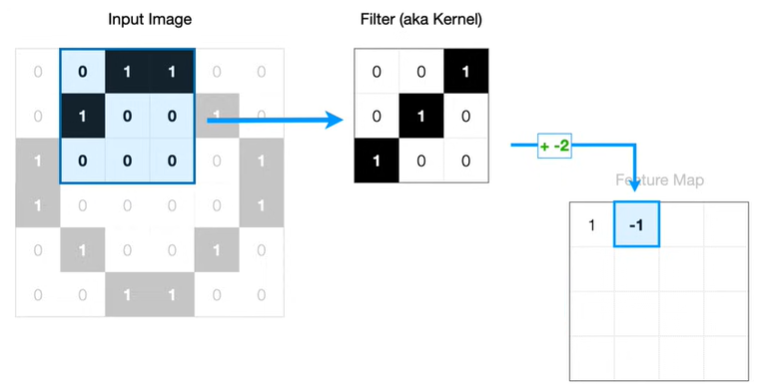

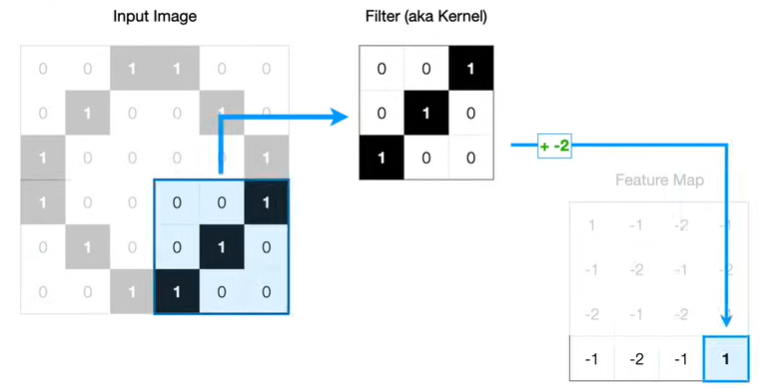

#### Cada célula do Feature Map corresponde a um grupo de pixels

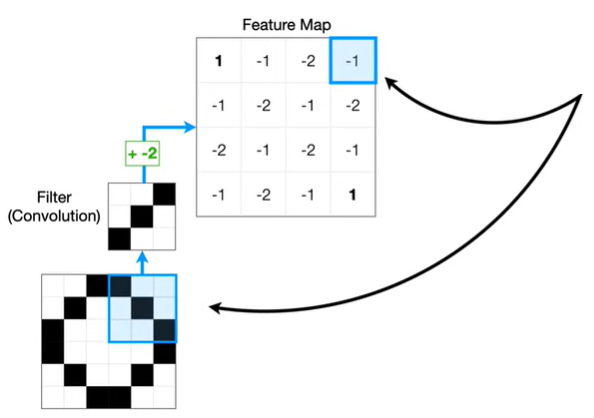

#### Função de atiação na CNN

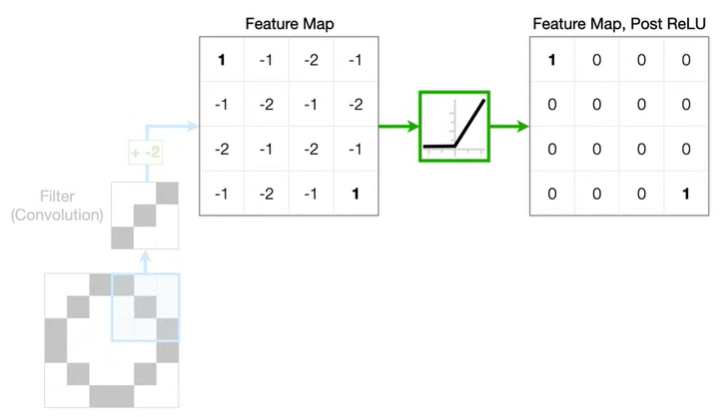

#### Pooling

##### Max Pooling

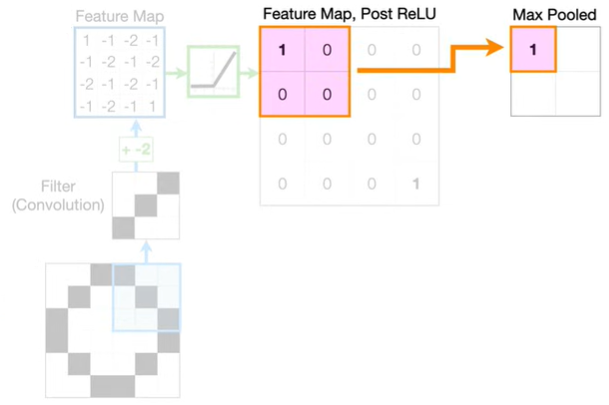

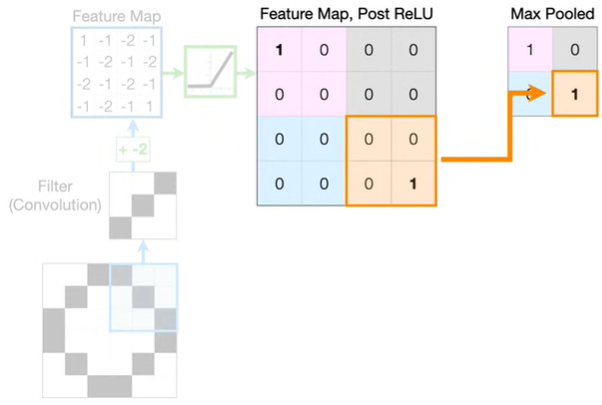

#### Mean Pooling

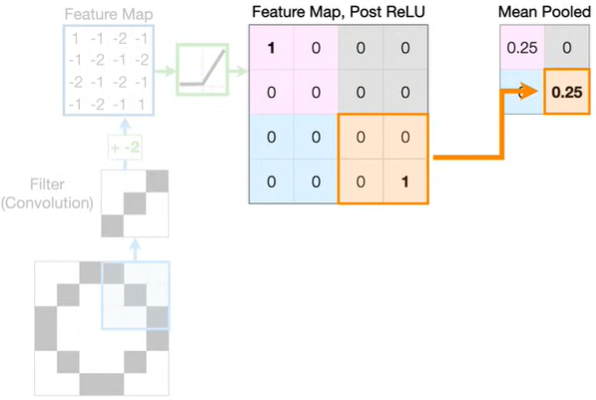

#### Alimentando a rede neural após a convolução e pooling

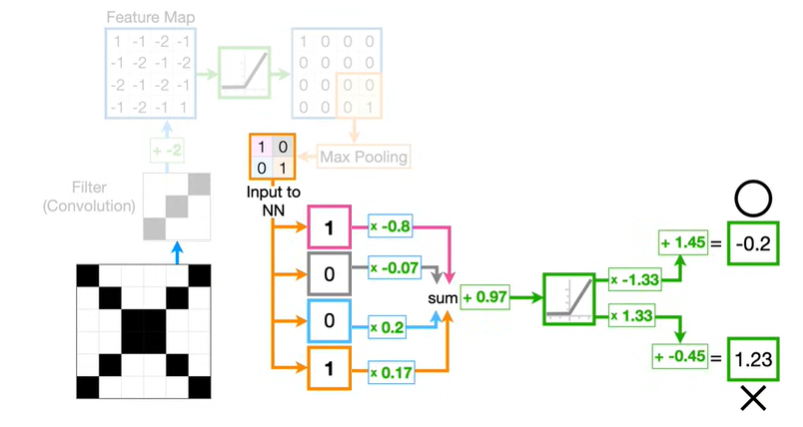

Arquitetura:

```text
Log-Mel
  ↓
Conv2D 16
  ↓
BatchNormalization
  ↓
MaxPooling
  ↓
Dropout
  ↓
Conv2D 32
  ↓
BatchNormalization
  ↓
MaxPooling
  ↓
Dropout
  ↓
Conv2D 64
  ↓
BatchNormalization
  ↓
MaxPooling
  ↓
GlobalAveragePooling
  ↓
Dense
  ↓
Sigmoid
```

A última camada produz:

\[
P(spoof \mid áudio)
\]

Com limiar `0.5`:

- probabilidade < 0.5 → `bonafide`;
- probabilidade ≥ 0.5 → `spoof`.


In [ ]:
# TODO crie um modelo CNN usando tf.keras.Sequential.
cnn = tf.keras.Sequential([
    # TODO adicione uma camada Input com shape=(N_MELS, N_FRAMES, 1).
    # A última dimensão 1 representa o canal único do espectrograma.
    ...,

    # TODO adicione uma camada convolucional Conv2D com:
    # - 8 filtros;
    # - kernel_size=(3, 3);
    # - padding="same";
    # - activation="relu".
    # A convolução aprende padrões locais presentes no espectrograma.
    ...,

    # TODO adicione MaxPooling2D com pool_size=(2, 2)
    # para reduzir pela metade as dimensões espaciais do mapa de características.
    ...,

    # TODO adicione uma segunda Conv2D com:
    # - 16 filtros;
    # - kernel_size=(3, 3);
    # - padding="same";
    # - activation="relu".
    # A segunda camada pode aprender padrões mais complexos a partir
    # das características extraídas pela primeira convolução.
    ...,

    # TODO adicione MaxPooling2D com pool_size=(2, 2)
    # para continuar reduzindo as dimensões espaciais.
    ...,

    # TODO aplique GlobalAveragePooling2D() para transformar cada mapa
    # de características em um único valor médio.
    # Isso reduz a quantidade de parâmetros antes das camadas Dense.
    ...,

    # TODO adicione uma camada Dense com 32 neurônios e ativação relu
    # para combinar as características extraídas pela CNN.
    ...,

    # TODO adicione Dropout com taxa de 0.5 para reduzir overfitting.
    # Durante o treinamento, 50% das ativações serão aleatoriamente zeradas.
    ...,

    # TODO adicione uma camada Dense de saída com 1 neurônio e ativação sigmoid
    # para produzir uma probabilidade entre 0 e 1 na classificação binária.
    ...
])

# TODO compile o modelo usando o otimizador Adam com learning rate=1e-4.
# TODO use loss="binary_crossentropy" para a classificação binária.
# TODO adicione as métricas BinaryAccuracy, Precision, Recall e AUC.
...


cnn.summary()

In [ ]:
# TODO crie EarlyStopping monitorando "val_loss", com patience=40,
# restore_best_weights=True e verbose=1.
early_stop = ...

# TODO crie ReduceLROnPlateau monitorando "val_loss", com factor=0.8,
# patience=15, min_lr=1e-6 e verbose=1.
reduce_lr = ...

# 9. Treinamento

Vamos treinar primeiro a MLP e depois a CNN.

O objetivo não é somente descobrir “qual deu maior accuracy”.

Queremos discutir:

> **O que muda quando a arquitetura conhece a estrutura local tempo × frequência?**


In [ ]:
history_mlp = ...

In [ ]:
# TODO treine o modelo cnn usando train_ds, validation_data=val_ds,
# epochs=EPOCHS, callbacks=[early_stop, reduce_lr] e verbose=1.
history_cnn = ...


In [ ]:
def plot_history(history, title):
    hist = pd.DataFrame(history.history)

    plt.figure(figsize=(10, 4))
    plt.plot(hist["accuracy"], label="Treino")
    plt.plot(hist["val_accuracy"], label="Validação")
    plt.title(f"{title} — Accuracy")
    plt.xlabel("Época")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 4))
    plt.plot(hist["loss"], label="Treino")
    plt.plot(hist["val_loss"], label="Validação")
    plt.title(f"{title} — Loss")
    plt.xlabel("Época")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


plot_history(history_mlp, "MLP")
plot_history(history_cnn, "CNN")


# 10. Avaliação

Accuracy sozinha pode esconder erros relevantes.

Vamos calcular:

- **Precision para spoof:** dos exemplos classificados como spoof, quantos eram realmente spoof?
- **Recall para spoof:** dos spoofs reais, quantos foram detectados?
- **F1:** equilíbrio entre Precision e Recall.
- **ROC-AUC:** capacidade de separar as duas classes.
- **Matriz de confusão:** quais tipos de erro aconteceram?
- **EER aproximado:** útil para discutir sistemas anti-spoofing e autenticação.


In [ ]:
def evaluate_model(model, dataset, labels, name):
    probs = model.predict(dataset, verbose=0).ravel()
    preds = (probs >= 0.5).astype(int)
    y_true = np.asarray(labels).astype(int)

    metrics = {
        "Modelo": name,
        "Accuracy": accuracy_score(y_true, preds),
        "Precision": precision_score(y_true, preds, zero_division=0),
        "Recall": recall_score(y_true, preds, zero_division=0),
        "F1": f1_score(y_true, preds, zero_division=0),
        "ROC-AUC": roc_auc_score(y_true, probs),
    }

    print("=" * 70)
    print(name)
    print("=" * 70)

    for key, value in metrics.items():
        if key != "Modelo":
            print(f"{key:10s}: {value:.4f}")

    print("\nClassification report:")
    print(
        classification_report(
            y_true,
            preds,
            target_names=["bonafide", "spoof"],
            digits=4,
            zero_division=0,
        )
    )

    cm = confusion_matrix(y_true, preds)

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        square=True,
        xticklabels=["bonafide", "spoof"],
        yticklabels=["bonafide", "spoof"],
    )
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.title(f"Matriz de confusão — {name}")
    plt.show()

    return {
        "metrics": metrics,
        "probs": probs,
        "preds": preds,
        "y_true": y_true,
    }


result_mlp = evaluate_model(
    mlp,
    test_ds,
    test_labels,
    "MLP Baseline",
)

result_cnn = evaluate_model(
    cnn,
    test_ds,
    test_labels,
    "CNN Log-Mel",
)


In [ ]:
# ============================================================
# 16. COMPARAÇÃO MLP VS CNN
# ============================================================

comparison = pd.DataFrame([
    {
        **result_mlp["metrics"],
        "Parâmetros": mlp.count_params(),
    },
    {
        **result_cnn["metrics"],
        "Parâmetros": cnn.count_params(),
    },
])

display(comparison.round(4))


# 11. ROC e EER

A CNN retorna uma probabilidade, portanto o limiar `0.5` é apenas uma convenção.

Em produção, o limiar deve refletir o custo dos erros.

Exemplo:

- **Falso negativo:** um deepfake é aceito como real;
- **Falso positivo:** uma pessoa real é classificada como suspeita.

Em cibersegurança, a escolha do limiar pode depender do risco da aplicação.


In [ ]:

fpr_mlp, tpr_mlp, _ = roc_curve(
    result_mlp["y_true"], result_mlp["probs"]
)
fpr_cnn, tpr_cnn, _ = roc_curve(
    result_cnn["y_true"], result_cnn["probs"]
)

plt.figure(figsize=(7, 6))
plt.plot(
    fpr_mlp,
    tpr_mlp,
    label=f"MLP (AUC={result_mlp['metrics']['ROC-AUC']:.3f})",
)
plt.plot(
    fpr_cnn,
    tpr_cnn,
    label=f"CNN (AUC={result_cnn['metrics']['ROC-AUC']:.3f})",
)
plt.plot([0, 1], [0, 1], "--", label="Aleatório")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.grid(alpha=0.25)
plt.show()


In [ ]:
def approximate_eer(y_true, scores):
    fpr, tpr, thresholds = roc_curve(y_true, scores)
    fnr = 1 - tpr

    idx = np.nanargmin(np.abs(fnr - fpr))
    eer = (fpr[idx] + fnr[idx]) / 2

    return float(eer), float(thresholds[idx])


eer_mlp, thr_mlp = approximate_eer(
    result_mlp["y_true"], result_mlp["probs"]
)

eer_cnn, thr_cnn = approximate_eer(
    result_cnn["y_true"], result_cnn["probs"]
)

eer_table = pd.DataFrame([
    {
        "Modelo": "MLP",
        "EER aproximado": eer_mlp,
        "Limiar": thr_mlp,
    },
    {
        "Modelo": "CNN",
        "EER aproximado": eer_cnn,
        "Limiar": thr_cnn,
    },
])

display(eer_table.round(4))


# 12. O que a CNN está enxergando?

Podemos observar os mapas de características das camadas convolucionais.

Aqui a entrada é um espectrograma, então um filtro pode responder a padrões locais no domínio tempo × frequência.

### Pergunta para a turma

Se uma CNN aprende “texturas” em uma imagem, o que ela pode aprender em um espectrograma?

Algumas hipóteses:

- transições de energia;
- padrões harmônicos;
- estruturas locais de frequência;
- descontinuidades;
- assinaturas espectrais relacionadas à síntese de fala.

Essas interpretações são hipóteses úteis para a aula, não garantias de que cada filtro aprendeu exatamente aquele significado sem análise adicional.


In [ ]:
# ------------------------------------------------------------
# 1. Carregar um espectrograma do conjunto de teste
# ------------------------------------------------------------

sample_spec = np.load(
    test_df.iloc[0]["spec_path"]
).astype(np.float32)

# Garantir shape:
# (N_MELS, N_FRAMES)
#        ↓
# (1, N_MELS, N_FRAMES, 1)

sample_input = sample_spec[np.newaxis, ..., np.newaxis]

print("Shape da entrada:", sample_input.shape)


# ------------------------------------------------------------
# 2. Criar uma nova entrada simbólica
# ------------------------------------------------------------

feature_input = tf.keras.Input(
    shape=(N_MELS, N_FRAMES, 1),
    name="feature_map_input"
)


# ------------------------------------------------------------
# 3. Repercorrer a CNN e capturar as Conv2D
# ------------------------------------------------------------

x = feature_input
conv_outputs = []
conv_names = []

for layer in cnn.layers:

    x = layer(x)

    if isinstance(layer, tf.keras.layers.Conv2D):
        conv_outputs.append(x)
        conv_names.append(layer.name)


print("\nCamadas convolucionais encontradas:")

for i, name in enumerate(conv_names):
    print(f"Conv2D #{i + 1}: {name}")


# ------------------------------------------------------------
# 4. Criar o modelo de extração de Feature Maps
# ------------------------------------------------------------

feature_model = tf.keras.Model(
    inputs=feature_input,
    outputs=conv_outputs,
    name="CNN_feature_maps"
)


# ------------------------------------------------------------
# 5. Gerar os Feature Maps
# ------------------------------------------------------------

feature_maps = feature_model.predict(
    sample_input,
    verbose=0
)


# ------------------------------------------------------------
# 6. Visualizar o espectrograma original
# ------------------------------------------------------------

plt.figure(figsize=(12, 4))

plt.imshow(
    sample_spec,
    origin="lower",
    aspect="auto"
)

plt.title(
    "Entrada Log-Mel — label real: "
    + LABEL_NAMES[int(test_df.iloc[0]["label"])]
)

plt.xlabel("Tempo")
plt.ylabel("Banco Mel")

plt.colorbar(label="Amplitude")

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 7. Visualizar os Feature Maps
# ------------------------------------------------------------

for layer_idx, fmap in enumerate(feature_maps):

    # Remover dimensão do batch
    # (1, altura, largura, filtros)
    #          ↓
    # (altura, largura, filtros)

    fmap = fmap[0]

    # Mostrar no máximo 8 filtros
    n_filters = min(8, fmap.shape[-1])

    fig, axes = plt.subplots(
        2,
        4,
        figsize=(14, 6)
    )

    axes = axes.ravel()

    # Desativar todos os eixos inicialmente
    for ax in axes:
        ax.axis("off")

    # Mostrar os primeiros filtros
    for i in range(n_filters):

        axes[i].imshow(
            fmap[:, :, i],
            origin="lower",
            aspect="auto"
        )

        axes[i].set_title(
            f"Filtro {i + 1}"
        )

        axes[i].axis("off")

    fig.suptitle(
        f"Feature Maps — {conv_names[layer_idx]}",
        fontsize=14
    )

    plt.tight_layout()
    plt.show()

# 13. Inspecionando as decisões

O modelo produz:

\[
P(spoof \mid áudio)
\]

Isso permite investigar não apenas a classe prevista, mas também a confiança do modelo.

Essa informação será útil para discutir:

- decisões próximas do limiar;
- possíveis falsos positivos;
- possíveis falsos negativos;
- necessidade de calibrar o limiar.


In [ ]:
# ============================================================
# 20. PREDIÇÕES DO TESTE
# ============================================================

pred_df = test_df[
    ["path", "label_name"]
].copy()

pred_df["prob_spoof"] = result_cnn["probs"]
pred_df["pred_label"] = np.where(
    pred_df["prob_spoof"] >= 0.5,
    "spoof",
    "bonafide",
)
pred_df["correto"] = (
    pred_df["pred_label"] == pred_df["label_name"]
)

print("Maiores probabilidades de spoof:")
display(
    pred_df.sort_values(
        "prob_spoof", ascending=False
    ).head(10)
)

print("Menores probabilidades de spoof:")
display(
    pred_df.sort_values(
        "prob_spoof", ascending=True
    ).head(10)
)


# 14. Exercício de Segurança: ajuste do limiar

Imagine um sistema de autenticação por voz.

### Cenário A — evitar aceitar deepfakes

Você quer reduzir falsos negativos para `spoof`.

### Cenário B — evitar bloquear usuários reais

Você quer reduzir falsos positivos.

A pergunta para discussão é:

> **Qual limiar faz mais sentido para cada cenário?**

Não existe necessariamente um único limiar “correto”: ele depende do custo de cada erro.


In [ ]:
# ============================================================
# 21. EFEITO DO LIMIAR
# ============================================================

rows = []

for threshold in np.arange(0.10, 0.91, 0.05):
    pred = (
        result_cnn["probs"] >= threshold
    ).astype(int)

    rows.append({
        "threshold": threshold,
        "precision_spoof": precision_score(
            result_cnn["y_true"],
            pred,
            zero_division=0,
        ),
        "recall_spoof": recall_score(
            result_cnn["y_true"],
            pred,
            zero_division=0,
        ),
        "f1": f1_score(
            result_cnn["y_true"],
            pred,
            zero_division=0,
        ),
    })

threshold_df = pd.DataFrame(rows)

display(threshold_df.round(3))

plt.figure(figsize=(9, 5))
plt.plot(
    threshold_df["threshold"],
    threshold_df["precision_spoof"],
    marker="o",
    label="Precision — spoof",
)
plt.plot(
    threshold_df["threshold"],
    threshold_df["recall_spoof"],
    marker="o",
    label="Recall — spoof",
)
plt.plot(
    threshold_df["threshold"],
    threshold_df["f1"],
    marker="o",
    label="F1",
)

plt.xlabel("Limiar")
plt.ylabel("Métrica")
plt.title("Impacto do limiar de decisão")
plt.grid(alpha=0.25)
plt.legend()
plt.show()


## 📚 Fonte principal

**AKCIT-Deepfake. BRSpeech-DF: A Deep Fake Synthetic Speech Dataset for Portuguese.**

Dataset: https://huggingface.co/datasets/AKCIT-Deepfake/BRSpeech-DF

A página oficial descreve `bonafide` como fala humana real e `spoof` como fala sintética/deepfake, informa os splits `train`, `validation` e `test` e relata que os áudios foram padronizados para 24 kHz.
